<a href="https://colab.research.google.com/github/Grimello/Estatistica-VineQuality/blob/main/Projeto_A_Wine_Quality_Edson_da_Silva_Grimello.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Módulo de estatística 

## Projeto A - Análise do dataset "Wine Quality"

### Instruções

- O projeto deverá ser entregue até dia 22/11 antes do início da aula
- O projeto poderá ser feito em grupo com até 4 integrantes
- Serão 2 projetos A e B porém apenas 1 projeto deverá ser entregue e escolhido pelo grupo

- A entrega deve ser feita em jupyter notebook com os códigos explícitos e comentados. Além disso os conceitos, decisões e conclusões usadas devem estar destacadas no notebook

### Informações sobre o projeto

Dataset (conjunto de dados a ser utilizado) está disponível em:
    https://archive.ics.uci.edu/ml/datasets/Wine+Quality

Data Set Information:

The two datasets are related to red and white variants of the Portuguese "Vinho Verde" wine. For more details, consult: [Web Link] or the reference [Cortez et al., 2009]. Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

These datasets can be viewed as classification or regression tasks. The classes are ordered and not balanced (e.g. there are many more normal wines than excellent or poor ones). Outlier detection algorithms could be used to detect the few excellent or poor wines. Also, we are not sure if all input variables are relevant. So it could be interesting to test feature selection methods.


Attribute Information:

Input variables (based on physicochemical tests): <br>
- 1 - fixed acidity
- 2 - volatile acidity
- 3 - citric acid
- 4 - residual sugar
- 5 - chlorides
- 6 - free sulfur dioxide
- 7 - total sulfur dioxide
- 8 - density
- 9 - pH
- 10 - sulphates
- 11 - alcohol

Output variable (based on sensory data): <br>
- 12 - quality (score between 0 and 10)

![image.png](attachment:image.png)

### Etapa 1

**EDA - Análise exploratória de dados**

- Análise das medidas de medidas de posição, dispersão, correlação (análises univaridas e bivariadas) - histograma, boxplot, mapa de calor, etc...
- Exclusão de outliers, caso necessário (sempre explicando a opção)



### Etapa 2

**Regressão Linear**

- Faça um algoritmo que estime a variável “Quality” em função das características físico-químicas dos vinhos
- Colocar comentários sobre a técnica utilizada e análise sobre as variáveis utilizadas, além dos seus respectivos “achados”. Faça uma interpretação do resultado

### Etapa 3

**Regressão logística**

- Sabendo que os vinhos com notas >= 6 são considerados vinhos de boa qualidade faça um algoritmo que classifique os vinhos em “Bom” ou “Ruim” em função de suas características físico-químicas;
- Colocar comentários sobre a técnica utilizada e análise sobre as variáveis utilizadas, além dos seus respectivos “achados”. Faça uma interpretação do resultado

### Etapa 1: EDA

In [ ]:
#Importação das bibliotecas que serão utilizadas

import pandas as pd
import numpy as np
from random import sample
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import plotly.express as px
from scipy.stats import zscore
from sklearn.utils import resample
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
!pip install --user yellowbrick
import warnings
warnings.filterwarnings('ignore')


In [ ]:
!pip install --user yellowbrick

In [ ]:
#Importação dos datasets  e visualização das linhas e colunas
url_branco = 'https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv'
vinho_branco = pd.read_csv(url_branco, sep= ';')

vinho_branco.head(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
5,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6
7,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
8,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
9,8.1,0.22,0.43,1.5,0.044,28.0,129.0,0.9938,3.22,0.45,11.0,6


In [ ]:
url_tinto = 'https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv'
vinho_tinto = pd.read_csv(url_tinto, sep=';')
vinho_tinto.head(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


In [ ]:
#Verificando quantidade de linhas e colunas dos datasets
vinho_branco.shape


(4898, 12)

In [ ]:
vinho_tinto.shape


(1599, 12)

In [ ]:
#Verificando os typos de dados
vinho_branco.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

In [ ]:
vinho_tinto.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

In [ ]:
#Visualização das medidas de posição dos datasets
vinho_branco.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


In [ ]:
vinho_tinto.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [ ]:
#Limpeza de dados: verificação se há dados ausentes ou duplicados
vinho_branco.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [ ]:
vinho_tinto.isnull().sum()


fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [ ]:
vinho_branco.duplicated().sum()

937

In [ ]:
vinho_tinto.duplicated().sum()

240

In [ ]:
vinho_branco[vinho_branco.duplicated()]


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.900000,6
5,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.100000,6
7,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.800000,6
8,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.500000,6
20,6.2,0.66,0.48,1.2,0.029,29.0,75.0,0.98920,3.33,0.39,12.800000,8
...,...,...,...,...,...,...,...,...,...,...,...,...
4828,6.4,0.23,0.35,10.3,0.042,54.0,140.0,0.99670,3.23,0.47,9.200000,5
4850,7.0,0.36,0.35,2.5,0.048,67.0,161.0,0.99146,3.05,0.56,11.100000,6
4851,6.4,0.33,0.44,8.9,0.055,52.0,164.0,0.99488,3.10,0.48,9.600000,5
4856,7.1,0.23,0.39,13.7,0.058,26.0,172.0,0.99755,2.90,0.46,9.000000,6


In [ ]:
vinho_tinto[vinho_tinto.duplicated()]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
11,7.5,0.500,0.36,6.10,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5
27,7.9,0.430,0.21,1.60,0.106,10.0,37.0,0.99660,3.17,0.91,9.5,5
40,7.3,0.450,0.36,5.90,0.074,12.0,87.0,0.99780,3.33,0.83,10.5,5
65,7.2,0.725,0.05,4.65,0.086,4.0,11.0,0.99620,3.41,0.39,10.9,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1563,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1564,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1567,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1581,6.2,0.560,0.09,1.70,0.053,24.0,32.0,0.99402,3.54,0.60,11.3,5


OS itens considerados 'duplicados' tratam-se de vinhos com os mesmos valores de variáveis e entendo que não necessariamente são duplicados, mas serão dropados justamente pela duplicação de valores que nao serão de valia para o treinamento do modelo.

In [ ]:
vinho_branco.drop_duplicates(inplace=True)
vinho_branco.shape

(3961, 12)

In [ ]:
vinho_tinto.drop_duplicates(inplace=True)
vinho_tinto.shape


(1359, 12)

Como os datasets são de tamanhos diferentes, sendo o de vinho branco maior,  serão igualados os números das amostras entre brancos e tintos.

In [ ]:
#amostragem simples do branco para igualar número de amostras com o tinto.
amostra_branco = vinho_branco.sample(n=1359,random_state=42)
amostra_branco

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
176,7.2,0.320,0.47,5.10,0.044,19.0,65.0,0.99100,3.03,0.41,12.6,4
1214,9.7,0.240,0.45,1.20,0.033,11.0,59.0,0.99260,2.74,0.47,10.8,6
1525,7.2,0.270,0.74,12.50,0.037,47.0,156.0,0.99810,3.04,0.44,8.7,5
862,4.8,0.340,0.00,6.50,0.028,33.0,163.0,0.99390,3.36,0.61,9.9,6
386,5.0,0.170,0.56,1.50,0.026,24.0,115.0,0.99060,3.48,0.39,10.8,7
...,...,...,...,...,...,...,...,...,...,...,...,...
3312,5.9,0.240,0.28,1.30,0.032,36.0,95.0,0.98889,3.08,0.64,12.9,7
2811,7.4,0.300,0.32,1.70,0.030,23.0,128.0,0.99290,3.17,0.66,10.9,5
1761,8.0,0.300,0.28,5.70,0.044,31.0,124.0,0.99480,3.16,0.51,10.2,6
3854,5.9,0.120,0.27,4.80,0.030,40.0,110.0,0.99226,3.55,0.68,12.1,6


In [ ]:
#Renomeação do index para identificação dos vinhos tintos e brancos
amostra_branco.index = [f'Vinho_Branco_{i}' for i in range(0,1359)]
amostra_branco

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
Vinho_Branco_0,7.2,0.320,0.47,5.10,0.044,19.0,65.0,0.99100,3.03,0.41,12.6,4
Vinho_Branco_1,9.7,0.240,0.45,1.20,0.033,11.0,59.0,0.99260,2.74,0.47,10.8,6
Vinho_Branco_2,7.2,0.270,0.74,12.50,0.037,47.0,156.0,0.99810,3.04,0.44,8.7,5
Vinho_Branco_3,4.8,0.340,0.00,6.50,0.028,33.0,163.0,0.99390,3.36,0.61,9.9,6
Vinho_Branco_4,5.0,0.170,0.56,1.50,0.026,24.0,115.0,0.99060,3.48,0.39,10.8,7
...,...,...,...,...,...,...,...,...,...,...,...,...
Vinho_Branco_1354,5.9,0.240,0.28,1.30,0.032,36.0,95.0,0.98889,3.08,0.64,12.9,7
Vinho_Branco_1355,7.4,0.300,0.32,1.70,0.030,23.0,128.0,0.99290,3.17,0.66,10.9,5
Vinho_Branco_1356,8.0,0.300,0.28,5.70,0.044,31.0,124.0,0.99480,3.16,0.51,10.2,6
Vinho_Branco_1357,5.9,0.120,0.27,4.80,0.030,40.0,110.0,0.99226,3.55,0.68,12.1,6


In [ ]:
vinho_tinto.index = [f'Vinho_Tinto_{i}' for i in range(0,1359)]
vinho_tinto

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
Vinho_Tinto_0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
Vinho_Tinto_1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
Vinho_Tinto_2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
Vinho_Tinto_3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
Vinho_Tinto_4,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
Vinho_Tinto_1354,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
Vinho_Tinto_1355,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
Vinho_Tinto_1356,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
Vinho_Tinto_1357,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [ ]:
#Juntando os dataframes
vinhos = pd.concat([amostra_branco, vinho_tinto])
vinhos

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
Vinho_Branco_0,7.2,0.320,0.47,5.1,0.044,19.0,65.0,0.99100,3.03,0.41,12.6,4
Vinho_Branco_1,9.7,0.240,0.45,1.2,0.033,11.0,59.0,0.99260,2.74,0.47,10.8,6
Vinho_Branco_2,7.2,0.270,0.74,12.5,0.037,47.0,156.0,0.99810,3.04,0.44,8.7,5
Vinho_Branco_3,4.8,0.340,0.00,6.5,0.028,33.0,163.0,0.99390,3.36,0.61,9.9,6
Vinho_Branco_4,5.0,0.170,0.56,1.5,0.026,24.0,115.0,0.99060,3.48,0.39,10.8,7
...,...,...,...,...,...,...,...,...,...,...,...,...
Vinho_Tinto_1354,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
Vinho_Tinto_1355,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
Vinho_Tinto_1356,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
Vinho_Tinto_1357,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [ ]:
vinhos.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2718 entries, Vinho_Branco_0 to Vinho_Tinto_1358
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         2718 non-null   float64
 1   volatile acidity      2718 non-null   float64
 2   citric acid           2718 non-null   float64
 3   residual sugar        2718 non-null   float64
 4   chlorides             2718 non-null   float64
 5   free sulfur dioxide   2718 non-null   float64
 6   total sulfur dioxide  2718 non-null   float64
 7   density               2718 non-null   float64
 8   pH                    2718 non-null   float64
 9   sulphates             2718 non-null   float64
 10  alcohol               2718 non-null   float64
 11  quality               2718 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 276.0+ KB


Removendo Outliers

In [ ]:
sex_q1 = covid['sex'].quantile(0.25)
sex_q3 = covid['sex'].quantile(0.75)
iqr = sex_q3 - sex_q1
lim_inf = sex_q1 - 1.5*iqr
lim_sup = sex_q3 + 1.5*iqr
print('Outliers:')
print('Q1: ', sex_q1)
print('Q3: ', sex_q3)
print('IQR:              ', iqr)
print('Limite Inferior:  ', lim_inf)
print('Limite Superior:  ', lim_sup)

# = vinhos[vinhos['fixed acidity'] < lim_sup]

NameError: ignored

In [ ]:
for column in vinhos_limpo.columns:
    if column != 'fixed acidity' and column != 'alcohol' and column != 'quality':
        q1 = vinhos_limpo[column].quantile(0.25)
        q3 = vinhos_limpo[column].quantile(0.75)
        iqr = q3 - q1
        lim_inf = q1 - 1.5*iqr
        lim_sup = q3 + 1.5*iqr

        vinhos_limpo = vinhos_limpo[vinhos_limpo[column] < lim_sup]

In [ ]:
vinhos_limpo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1899 entries, Vinho_Branco_0 to Vinho_Tinto_1358
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1899 non-null   float64
 1   volatile acidity      1899 non-null   float64
 2   citric acid           1899 non-null   float64
 3   residual sugar        1899 non-null   float64
 4   chlorides             1899 non-null   float64
 5   free sulfur dioxide   1899 non-null   float64
 6   total sulfur dioxide  1899 non-null   float64
 7   density               1899 non-null   float64
 8   pH                    1899 non-null   float64
 9   sulphates             1899 non-null   float64
 10  alcohol               1899 non-null   float64
 11  quality               1899 non-null   int64  
 12  rating                1899 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 207.7+ KB


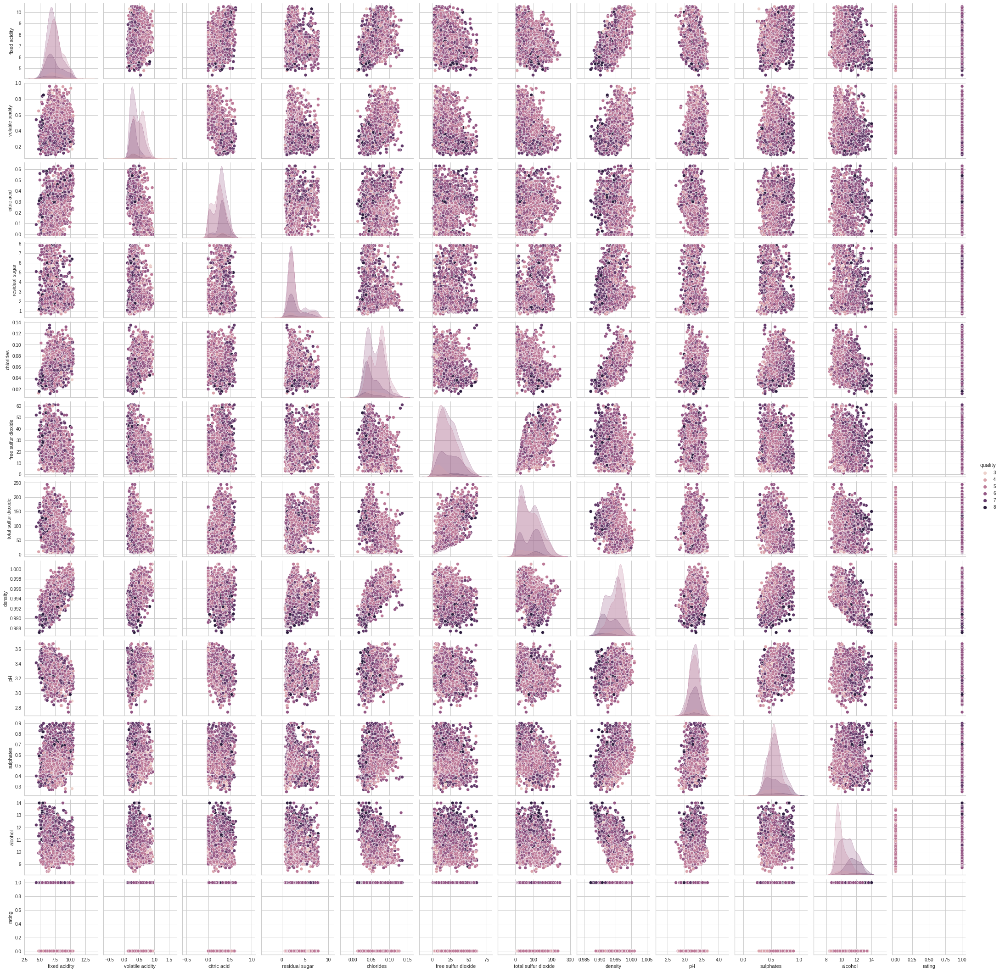

In [ ]:
sns.pairplot(vinhos_limpo, hue='quality')
plt.show()

In [ ]:
vinhos_limpo.corr()['quality']

fixed acidity          -0.141040
volatile acidity       -0.345313
citric acid             0.200151
residual sugar          0.025447
chlorides              -0.300611
free sulfur dioxide     0.219257
total sulfur dioxide    0.086093
density                -0.377121
pH                      0.004265
sulphates               0.147282
alcohol                 0.508362
quality                 1.000000
rating                  0.837096
Name: quality, dtype: float64

In [ ]:
vinhos_limpo.quality.max()

8

In [ ]:
vinhos_limpo.quality.min()

3

In [ ]:
vinhos_limpo.describe().loc['std',:]

fixed acidity            1.185498
volatile acidity         0.190871
citric acid              0.149201
residual sugar           0.824924
chlorides                0.022992
free sulfur dioxide     11.986728
total sulfur dioxide    48.221593
density                  0.002708
pH                       0.146703
sulphates                0.125100
alcohol                  1.128906
quality                  0.852563
rating                   0.492669
Name: std, dtype: float64

In [ ]:
vinhos_limpo['quality'].value_counts()

6    654
5    597
7    254
4     65
8     34
3      3
Name: quality, dtype: int64

In [ ]:
vinhos_limpo['quality'].describe()

count    1607.000000
mean        5.742377
std         0.852563
min         3.000000
25%         5.000000
50%         6.000000
75%         6.000000
max         8.000000
Name: quality, dtype: float64

In [ ]:
#Verificando os tipos de variáveis do dataset para levantar necessidade de conversão
vinhos_limpo.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
rating                    int64
dtype: object

## Correlações e gráficos

In [ ]:
#Correlação entre as variáveis e a target 'quality'
for x in vinhos_limpo.columns:
    print(vinhos_limpo[[x,'quality']].corr())
    print()

               fixed acidity  quality
fixed acidity        1.00000 -0.14104
quality             -0.14104  1.00000

                  volatile acidity   quality
volatile acidity          1.000000 -0.345313
quality                  -0.345313  1.000000

             citric acid   quality
citric acid     1.000000  0.200151
quality         0.200151  1.000000

                residual sugar   quality
residual sugar        1.000000  0.025447
quality               0.025447  1.000000

           chlorides   quality
chlorides   1.000000 -0.300611
quality    -0.300611  1.000000

                     free sulfur dioxide   quality
free sulfur dioxide             1.000000  0.219257
quality                         0.219257  1.000000

                      total sulfur dioxide   quality
total sulfur dioxide              1.000000  0.086093
quality                           0.086093  1.000000

          density   quality
density  1.000000 -0.377121
quality -0.377121  1.000000

               pH   qualit

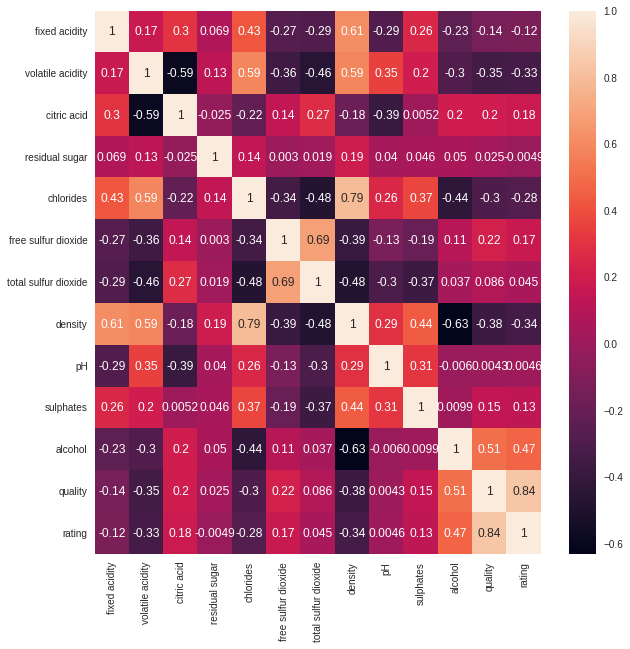

In [ ]:
# Verificação da correlação entre variáveis para visualização no mapa de calor de possíveis pares com informação similar
plt.figure(figsize=(10,10))
sns.heatmap(vinhos_limpo.corr(), color='k', annot=True)
plt.show()

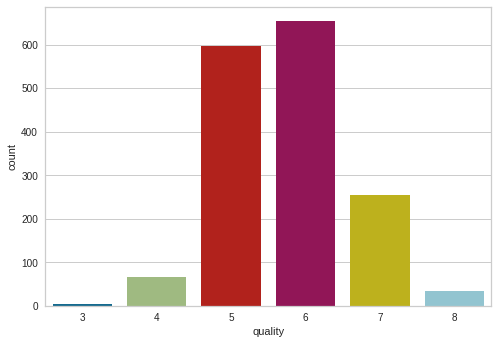

In [ ]:
sns.countplot(x='quality', data=vinhos_limpo)


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,rating
Vinho_Branco_1,9.7,0.240,0.45,1.2,0.033,11.0,59.0,0.99260,2.74,0.47,10.8,6,1
Vinho_Branco_4,5.0,0.170,0.56,1.5,0.026,24.0,115.0,0.99060,3.48,0.39,10.8,7,1
Vinho_Branco_5,7.1,0.180,0.42,1.4,0.045,47.0,157.0,0.99160,2.95,0.31,10.5,6,1
Vinho_Branco_10,7.9,0.280,0.41,4.9,0.058,31.0,153.0,0.99660,3.27,0.51,9.7,6,1
Vinho_Branco_11,5.6,0.340,0.25,2.5,0.046,47.0,182.0,0.99093,3.21,0.40,11.3,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Vinho_Tinto_1354,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,1
Vinho_Tinto_1355,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,0
Vinho_Tinto_1356,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,1
Vinho_Tinto_1357,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,0


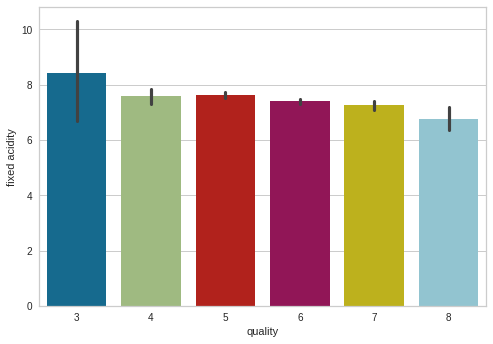

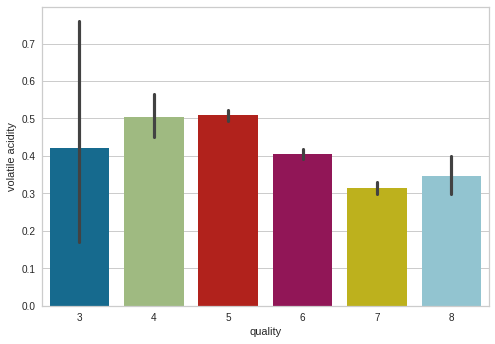

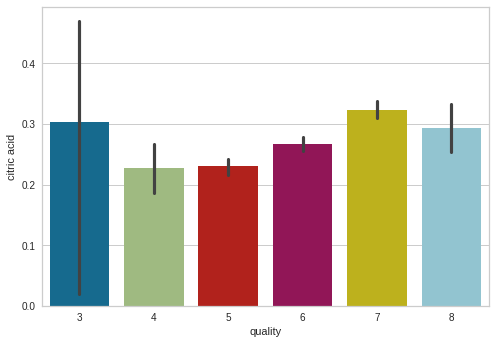

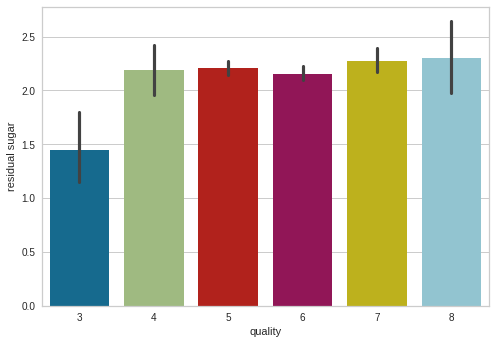

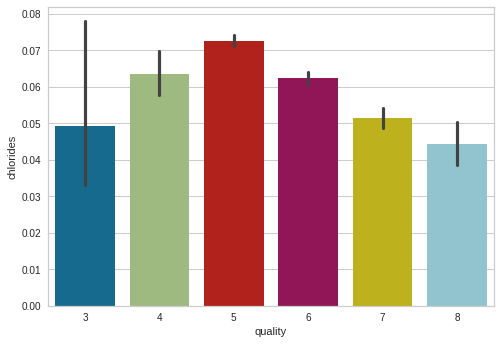

...

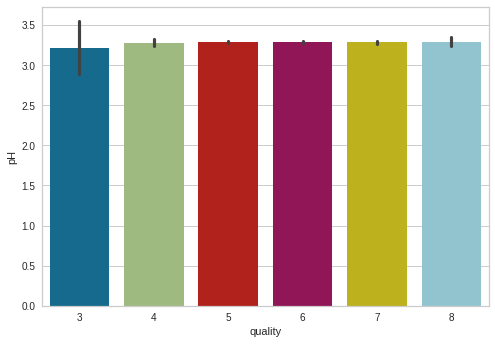

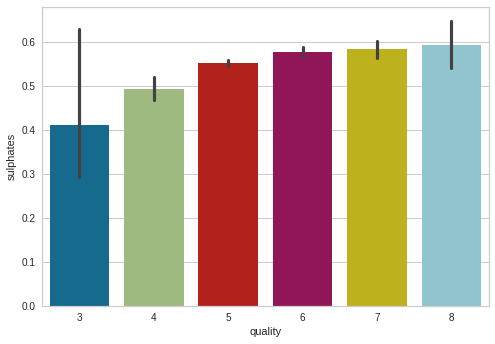

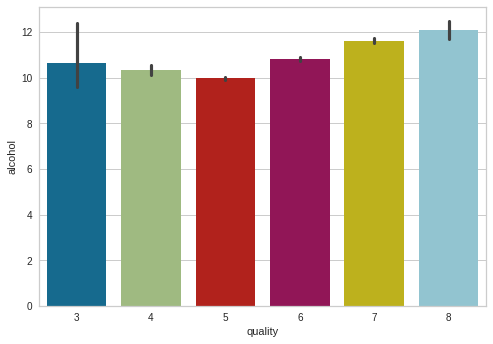

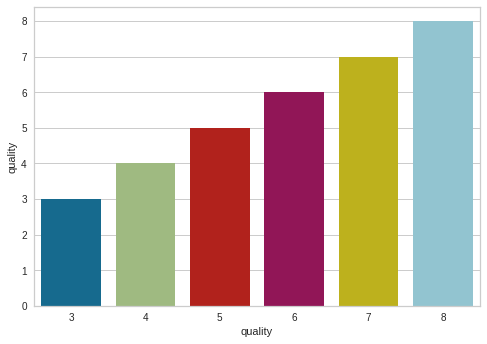

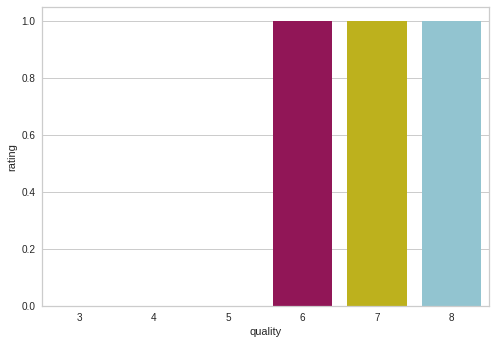

In [ ]:
vinhos1 = vinhos_limpo.select_dtypes([np.int, np.float])
for i, col in enumerate(vinhos1.columns):
  plt.figure(i)
  sns.barplot(x='quality', y=col, data=vinhos1)
vinhos1

Pelos gráficos percebe-se que o incremento da qualidade está relacionada a baixa 'volatility acidity' e 'chlorides' e a qualidade aparentemente aumenta com valores maiores de 'sulphates', 'citric acid' e 'alcohol'.


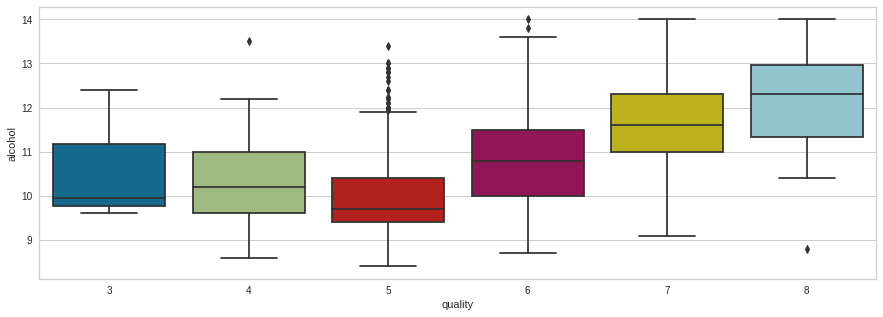

In [ ]:
#visualizando melhor a relação positiva entre qualidade e alcool
plt.figure(figsize=(15,5))
sns.boxplot(x='quality', y='alcohol', data=vinhos_limpo)
plt.show()

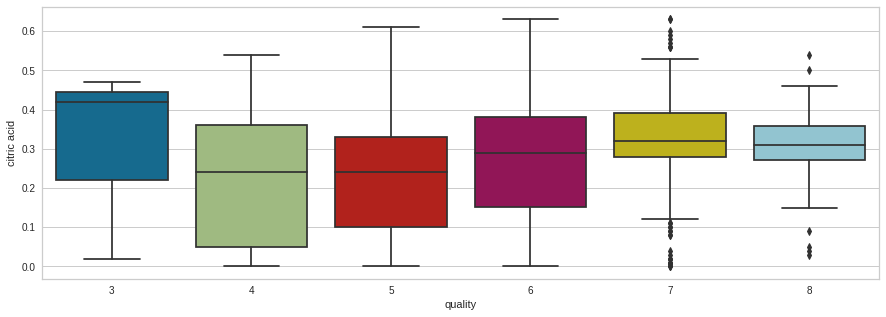

In [ ]:
#visualizando melhor a relação positiva entre qualidade e acidos citricos
plt.figure(figsize=(15,5))
sns.boxplot(x='quality', y='citric acid', data=vinhos_limpo)
plt.show()

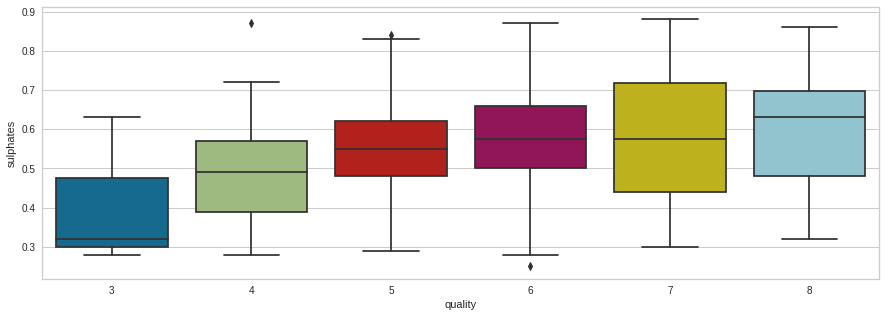

In [ ]:
#visualizando melhor a relação positiva entre qualidade e sulfatos
plt.figure(figsize=(15,5))
sns.boxplot(x='quality', y='sulphates', data=vinhos_limpo)
plt.show()

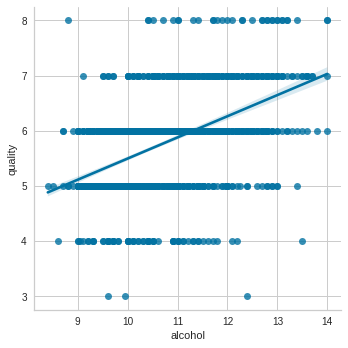

In [ ]:
sns.lmplot(x='alcohol', y='quality', data=vinhos_limpo)

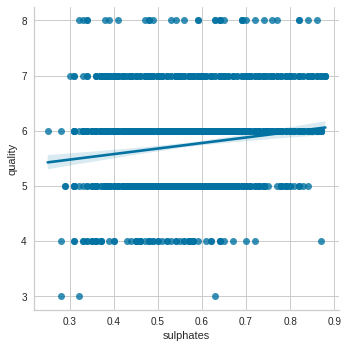

In [ ]:
sns.lmplot(x='sulphates', y='quality', data=vinhos_limpo)

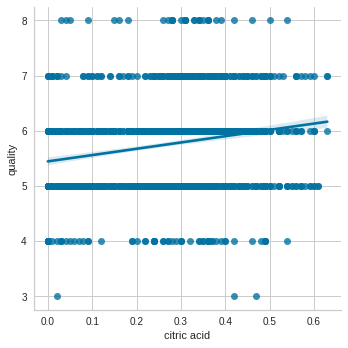

In [ ]:
sns.lmplot(x='citric acid', y='quality', data=vinhos_limpo)

In [ ]:
vinhos_limpo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1607 entries, Vinho_Branco_1 to Vinho_Tinto_1358
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1607 non-null   float64
 1   volatile acidity      1607 non-null   float64
 2   citric acid           1607 non-null   float64
 3   residual sugar        1607 non-null   float64
 4   chlorides             1607 non-null   float64
 5   free sulfur dioxide   1607 non-null   float64
 6   total sulfur dioxide  1607 non-null   float64
 7   density               1607 non-null   float64
 8   pH                    1607 non-null   float64
 9   sulphates             1607 non-null   float64
 10  alcohol               1607 non-null   float64
 11  quality               1607 non-null   int64  
 12  rating                1607 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 255.8+ KB


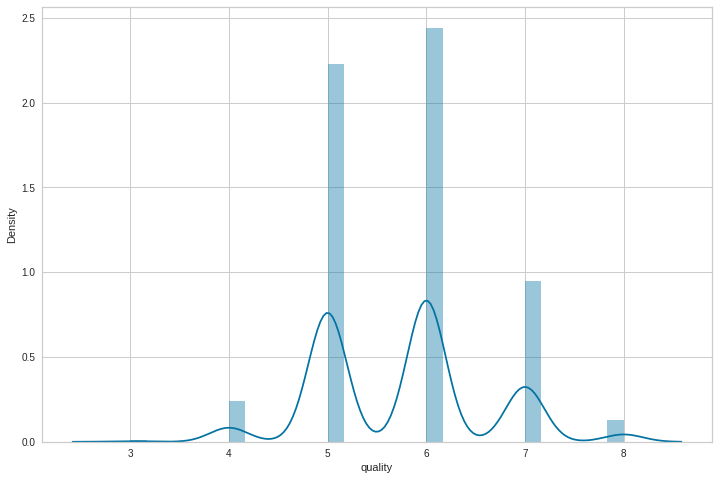

In [ ]:
plt.figure(figsize=(12,8))
sns.distplot(vinhos_limpo['quality'], kde=True)
plt.show()

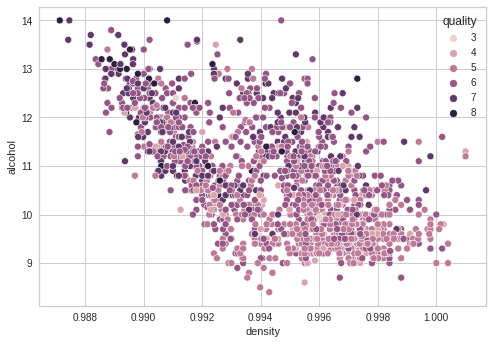

In [ ]:
sns.scatterplot(data=vinhos_limpo, x='density', y='alcohol', hue='quality')
plt.show()

 ### Etapa 2: Regressão Linear - target (y) = quality

In [ ]:
X = vinhos_limpo.drop(['quality'], axis = 1)
y = vinhos_limpo['quality']

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1124, 12), (483, 12), (1124,), (483,))

In [ ]:
from sklearn.preprocessing import StandardScaler


In [ ]:
std = StandardScaler()

In [ ]:
X_train_std = std.fit_transform(X_train)

In [ ]:
X_train_std

array([[-0.32113513, -1.11321874, -0.18633292, ..., -1.57096265,
         0.6569296 ,  0.87595411],
       [ 0.10426957,  1.17600453, -1.04876454, ..., -0.43542437,
        -1.18225686, -1.14161232],
       [ 0.10426957,  0.51818175, -0.84974186, ...,  0.37567439,
        -1.09326397, -1.14161232],
       ...,
       [ 1.72080743,  0.6234334 ,  0.47707602, ...,  1.34899292,
         1.04256546,  0.87595411],
       [-0.15097325,  0.78131086,  0.01268976, ..., -0.3543145 ,
        -0.6482995 , -1.14161232],
       [-0.06589231,  0.41293011, -0.84974186, ...,  0.21345464,
         0.15263654,  0.87595411]])

In [ ]:
X_test_std = std.transform(X_test)

In [ ]:
X_test_std

array([[-1.08686359, -0.79746381,  0.41073512, ..., -1.57096265,
         2.19947307,  0.87595411],
       [-0.57637795,  1.0970658 , -1.57949169, ...,  0.45678427,
        -0.20333504,  0.87595411],
       [-1.25702547, -0.21857976,  0.27805334, ..., -0.678754  ,
        -0.47031372,  0.87595411],
       ...,
       [ 2.316374  , -0.21857976,  0.94146227, ...,  2.40342131,
        -0.11434214,  0.87595411],
       [ 0.01918863,  0.41293011,  0.94146227, ...,  0.61900402,
         1.04256546,  0.87595411],
       [-1.42718735, -1.37634785,  0.14537155, ..., -0.3543145 ,
         0.50860811,  0.87595411]])

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
linreg = LinearRegression()

In [ ]:
linreg.fit(X_train_std, y_train)

LinearRegression()

In [ ]:
y_pred = linreg.predict(X_test_std)
y_pred

array([6.54891102, 6.19979455, 6.14043024, 6.42025802, 6.24585551,
       4.74890322, 6.215075  , 6.31505381, 4.99710684, 5.13872584,
       6.41143492, 6.40329617, 6.28929288, 6.16216107, 6.08956982,
       4.87231443, 4.95134805, 6.31882972, 6.39233694, 5.06908153,
       4.84614984, 5.12237556, 4.95818397, 6.36331226, 6.49341612,
       4.79775776, 6.49707196, 6.10451264, 6.41483207, 6.36585816,
       6.54261702, 6.48420246, 6.46477226, 4.90248741, 6.4009388 ,
       6.37545762, 6.53154986, 6.37528471, 4.909865  , 6.35376289,
       5.16401397, 6.40531952, 6.5528587 , 4.92198191, 6.37087053,
       6.16100065, 6.37014072, 4.96321489, 4.97580406, 6.40028595,
       6.02392291, 6.29250431, 4.91987302, 6.19898718, 4.94393055,
       6.14301863, 6.61019847, 6.57666652, 6.36598957, 6.11052343,
       4.97043509, 6.27455786, 4.87763713, 4.86819949, 6.10548888,
       6.30096983, 5.15234344, 5.12211437, 4.90231759, 6.31236816,
       6.44712905, 4.91759768, 4.86517167, 6.4119712 , 4.85566

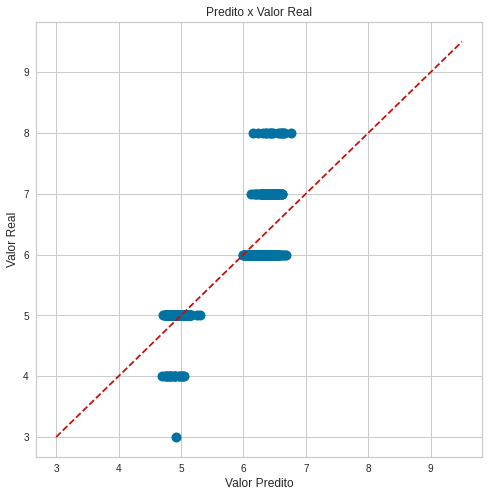

In [ ]:
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Predito x Valor Real', fontsize=12)
plt.ylabel("Valor Real", fontsize=12)
plt.xlabel("Valor Predito", fontsize=12)

# mostra os valores preditos e originais
xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')

plt.show()

In [ ]:
print('Métricas para a Previsão')
print('Erro Absoluto Médio:', np.round(mean_absolute_error(y_test, y_pred), 3))
print('Erro Quadrático Médio:', np.round(mean_squared_error(y_test, y_pred), 3))
print('R^2:', np.round(r2_score(y_test, y_pred), 3))

Métricas para a Previsão
Erro Absoluto Médio: 0.348
Erro Quadrático Médio: 0.226
R^2: 0.711


In [ ]:
from sklearn.metrics import r2_score
R2 = r2_score(y_test, y_pred)
print('R2:', R2)

R2: 0.711359948473835


### Conclusão do Modelo de Regressão Linear

O modelo de Regressão Linear utilizado se mostrou inadequado para os tipos de dados disponíveis e o R2 baixo demonstra underfit apesar das tratativas dadas aos dados disponíveis.

### Análise dos resíduos

In [ ]:
residuos = y_test - y_pred
residuos

Vinho_Branco_1162    0.451089
Vinho_Tinto_1030    -0.199795
Vinho_Branco_389    -0.140430
Vinho_Branco_299    -0.420258
Vinho_Branco_962    -0.245856
                       ...   
Vinho_Tinto_870     -0.239121
Vinho_Tinto_1115     0.118404
Vinho_Tinto_1009    -0.632470
Vinho_Tinto_1337    -0.276164
Vinho_Branco_1288   -0.239804
Name: quality, Length: 483, dtype: float64

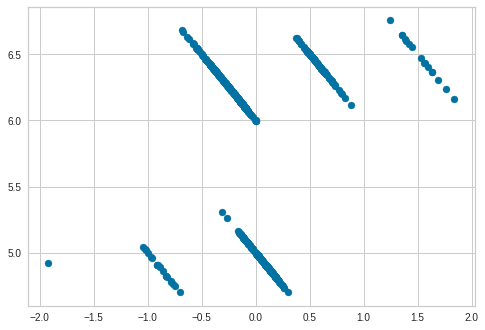

In [ ]:
plt.scatter(residuos, y_pred)
plt.show()

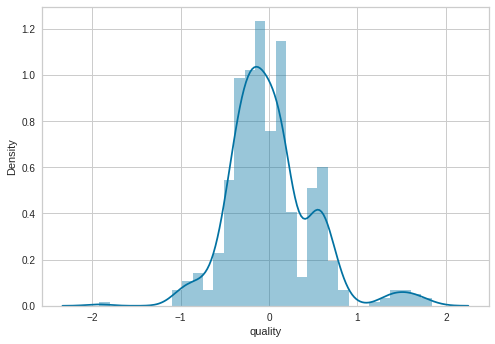

In [ ]:
#Visualizando a distribuição dos residuos
sns.distplot(residuos, kde=True)

In [ ]:
from yellowbrick.regressor import ResidualsPlot

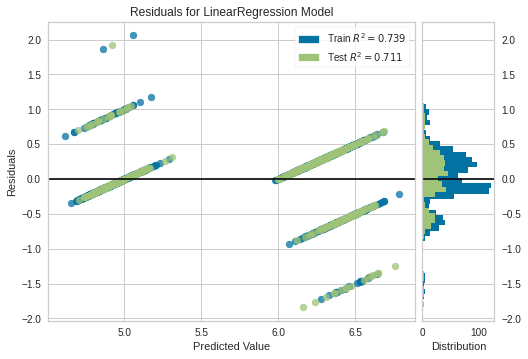

In [ ]:
visualizador = ResidualsPlot(linreg)
visualizador.fit(X_train_std, y_train)
visualizador.score(X_test_std, y_test)
visualizador.show()
plt.show()

### Etapa 3: Regressão Logística

In [ ]:
# 0 = 'ruim
# 1 = 'bom'
vinhos_limpo['rating'] = np.where(
    vinhos_limpo['quality'].isin(range(1,6)),
    0, 
    1 )

In [ ]:
vinhos_limpo['rating'].value_counts(normalize=True)

1    0.586185
0    0.413815
Name: rating, dtype: float64

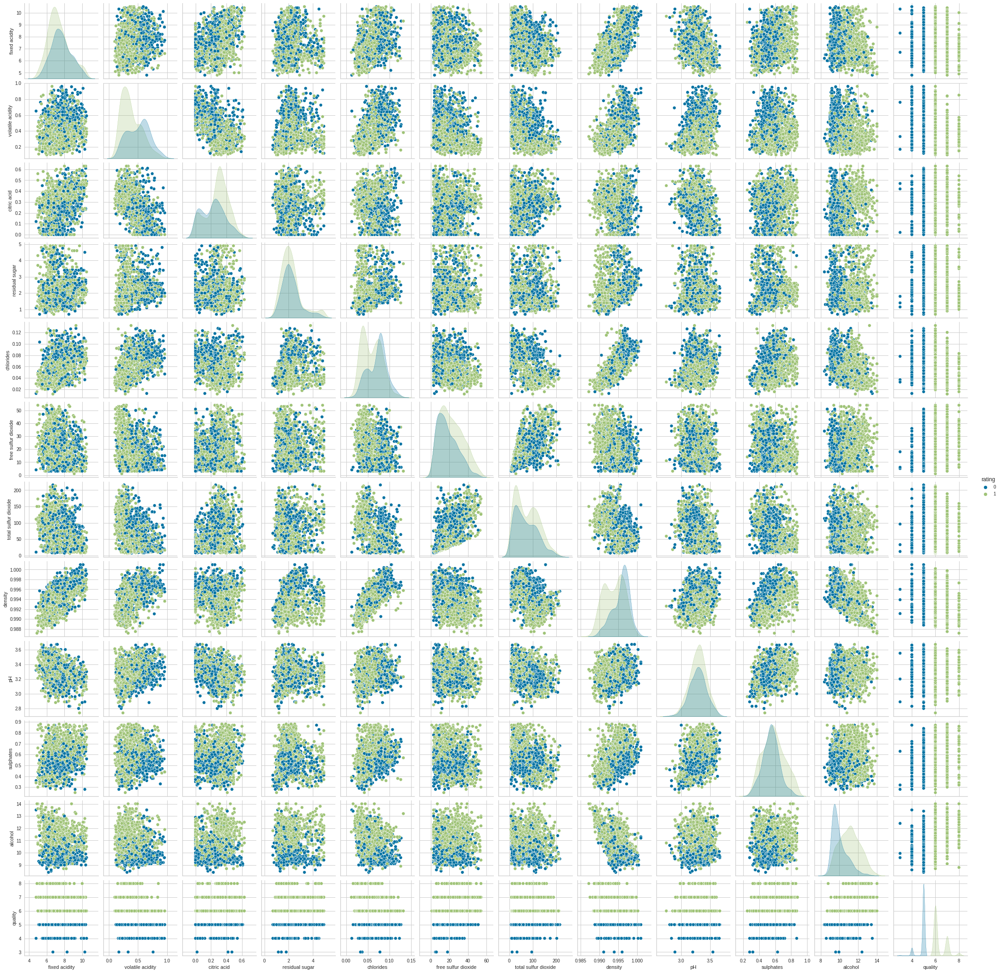

In [ ]:
sns.pairplot(vinhos_limpo, hue="rating")
plt.show()

In [ ]:
vinhos_limpo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1607 entries, Vinho_Branco_1 to Vinho_Tinto_1358
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1607 non-null   float64
 1   volatile acidity      1607 non-null   float64
 2   citric acid           1607 non-null   float64
 3   residual sugar        1607 non-null   float64
 4   chlorides             1607 non-null   float64
 5   free sulfur dioxide   1607 non-null   float64
 6   total sulfur dioxide  1607 non-null   float64
 7   density               1607 non-null   float64
 8   pH                    1607 non-null   float64
 9   sulphates             1607 non-null   float64
 10  alcohol               1607 non-null   float64
 11  quality               1607 non-null   int64  
 12  rating                1607 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 255.8+ KB


In [ ]:
X = vinhos_limpo[['alcohol','sulphates','density','volatile acidity','citric acid','chlorides']]
y = vinhos_limpo['rating']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

std = StandardScaler()
X_train_std = std.fit_transform(X_train)
X_test_std = std.transform(X_test)

In [ ]:
modelo = LogisticRegression()
modelo.fit(X_train_std, y_train)
y_pred = modelo.predict(X_test_std)

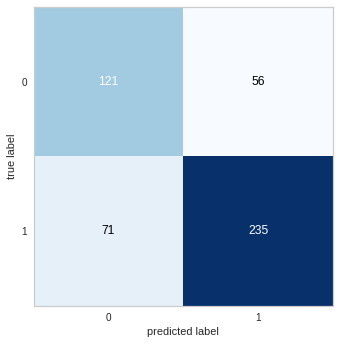

In [ ]:
# Matriz de confusão
conf = confusion_matrix(y_test, y_pred)
plot_confusion_matrix(conf_mat=conf)
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score
print('Accuracy:', accuracy_score(y_test, y_pred))

from sklearn.metrics import precision_score
print('Precision score:', precision_score(y_test, y_pred))

from sklearn.metrics import recall_score
print('Recall score:', recall_score(y_test, y_pred))

from sklearn.metrics import f1_score
print('F1 Score:', f1_score(y_test, y_pred))

print('\n')
from sklearn.metrics import classification_report

# Classification report
print(classification_report(y_test, y_pred))

Accuracy: 0.7370600414078675
Precision score: 0.8075601374570447
Recall score: 0.7679738562091504
F1 Score: 0.7872696817420436


              precision    recall  f1-score   support

           0       0.63      0.68      0.66       177
           1       0.81      0.77      0.79       306

    accuracy                           0.74       483
   macro avg       0.72      0.73      0.72       483
weighted avg       0.74      0.74      0.74       483



### Conclusão do Modelo de Regressão Logística

O Modelo de Regressão Logística se mostra eficaz no objetivo de classificação dos vinhos entre bons ou ruins.

### Conclusão Geral

Na EDA, o tratamento dos dados e os métodos utilizados para trabalhar os outliers foram adequados para a montagem dos modelos e os modelos solicitados se mostram adequados para a estimação da variável 'quality' em função das características fisico-quimicas (Reressão Linear) e na classificação dos vinhos em 'Bom' e 'Ruim' também de acordo com as características fisico-quimicas.